In [673]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Configure Notebook
%matplotlib inline
plt.style.use('fivethirtyeight')
sns.set_context("notebook")
import warnings
warnings.filterwarnings('ignore')
import geopandas as gpd



In [674]:

# Replace 'your_file.shp' with the path to your shapefile
#shapefile_path = r'C:\Users\amoore\Downloads\GIS_Data_-_Future_Transit_Network_-_2023-05-12\RTP_POINTS.shp'

# Read the shapefile
gdf_points= gpd.read_file('RTP_POINTS.shp')

print(gdf_points.columns)

Index(['LOCATION_N', 'STATUS', 'TECHNOLOGY', 'NAME', 'geometry'], dtype='object')


In [675]:
gdf_points

,LOCATION_N,STATUS,TECHNOLOGY,NAME,geometry
0,Creditstone,Existing,BRT,Highway 7 West BRT,POINT (303369.273 4850639.811)
1,Keele,Existing,BRT,Highway 7 West BRT,POINT (304847.452 4851150.715)
2,Davis,In Delivery,BRT,Yonge North BRT,POINT (306373.949 4879421.963)
3,Eagle,Existing,BRT,Yonge North BRT,POINT (306550.211 4878383.22)
4,Mulock,Existing,BRT,Yonge North BRT,POINT (306720.789 4877366.807)
...,...,...,...,...,...
382,St. Marys,Existing,GO Rail,Kitchener,POINT (171712.316 4790417.363)
383,London,Existing,GO Rail,Kitchener,POINT (162040.578 4761503.364)
384,Milton-Trafalgar,Proposed,GO Rail,Milton,POINT (279034.513 4824823.447)
385,Beamsville,Proposed,GO Rail,Lakeshore West,POINT (307028.973 4782332.52)


In [676]:
gdf_points['STATUS'].unique()


array(['Existing', 'In Delivery', 'Proposed', 'Advancing'], dtype=object)

In [677]:
gdf_points_toronto['NAME'].unique()

array(['Eglinton Crosstown LRT', 'Line 2: Bloor-Danforth Subway',
       'Line 1: Yonge-University Subway', 'Line 4: Sheppard Subway',
       'Line 3: Scarborough RT', 'Scarborough Subway Extension',
       'UP Express', 'Finch West LRT', 'Lakeshore East', 'Richmond Hill',
       'Stouffville', 'Kitchener', 'Milton', 'ALL', 'Lakeshore West',
       'Barrie', 'Lakeshore East and Stouffville',
       'Eglinton Crosstown West Extension', 'Eglinton East LRT',
       'Yonge North Subway Extension', 'Ontario Line'], dtype=object)

In [678]:
gdf_points.crs

<Projected CRS: EPSG:2952>
Name: NAD83(CSRS) / MTM zone 10
Axis Info [cartesian]:
- E(X)[east]: Easting (metre)
- N(Y)[north]: Northing (metre)
Area of Use:
- name: Canada - Quebec west of 78°W; Canada - Ontario - between 79°30'W and 78°W in area to north of 47°N; between 80°15'W and 78°W in area between 46°N and 47°N; between 81°W and 78°W in area south of 46°N.
- bounds: (-81.0, 42.26, -78.0, 62.45)
Coordinate Operation:
- name: MTM zone 10
- method: Transverse Mercator
Datum: NAD83 Canadian Spatial Reference System
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [679]:
# Read the shapefile
gdf_network = gpd.read_file('RTP_TRANSIT_NETWORK.shp')

print(network.head())
print(gdf_network.columns)


     STATUS    TECHNOLOGY                      NAME    Shape_Leng   
0  Proposed  Priority Bus                     Bayly  12759.268167  \
1  Proposed     LRT / BRT                Simcoe BRT  10223.298622   
2  Proposed  Priority Bus           Trafalgar North   8333.617921   
3  Proposed  Priority Bus                     Brant   6397.385174   
4  Proposed  Priority Bus  Hamilton Mohawk (T-Line)  20928.691262   

                                            geometry  
0  LINESTRING (338248.502 4854736.031, 338312.491...  
1  MULTILINESTRING ((354663.722 4866048.782, 3559...  
2  LINESTRING (279034.513 4824823.447, 279921.981...  
3  MULTILINESTRING ((279236.752 4799765.718, 2792...  
4  LINESTRING (264999.178 4786732.487, 265550.398...  
Index(['STATUS', 'TECHNOLOGY', 'NAME', 'Shape_Leng', 'geometry'], dtype='object')


In [680]:
gdf_network

,STATUS,TECHNOLOGY,NAME,Shape_Leng,geometry
0,Proposed,Priority Bus,Bayly,12759.268167,"LINESTRING (338248.502 4854736.031, 338312.491..."
1,Proposed,LRT / BRT,Simcoe BRT,10223.298622,"MULTILINESTRING ((354663.722 4866048.782, 3559..."
2,Proposed,Priority Bus,Trafalgar North,8333.617921,"LINESTRING (279034.513 4824823.447, 279921.981..."
3,Proposed,Priority Bus,Brant,6397.385174,"MULTILINESTRING ((279236.752 4799765.718, 2792..."
4,Proposed,Priority Bus,Hamilton Mohawk (T-Line),20928.691262,"LINESTRING (264999.178 4786732.487, 265550.398..."
...,...,...,...,...,...
122,Proposed,Priority Bus,Maple Grove,20236.738023,"LINESTRING (238128.435 4806155.86, 238273.58 4..."
123,Proposed,LRT / BRT,ION Victoria BRT (Stage 3),14233.484610,"LINESTRING (230807.054 4815803.767, 230797.007..."
124,Proposed,LRT / BRT,ION Erb / University / King BRT (Stage 3),9828.350191,"LINESTRING (218910.453 4811203.892, 218980.75 ..."
125,Existing (To Be Removed),Priority Bus,ION Cambridge Bus,18234.154199,"LINESTRING (228512.532 4809598.38, 228628.529 ..."


In [681]:
gdf_network['STATUS'].unique()
gdf_network['TECHNOLOGY'].unique()


array(['Priority Bus', 'LRT / BRT', 'Subway', 'GO Rail - 15-min',
       'GO Rail - All-day', 'GO Rail - Peak Only',
       'GO Rail - Peak & Limited Off-Peak'], dtype=object)

In [682]:
gdf_network.crs

<Projected CRS: EPSG:2952>
Name: NAD83(CSRS) / MTM zone 10
Axis Info [cartesian]:
- E(X)[east]: Easting (metre)
- N(Y)[north]: Northing (metre)
Area of Use:
- name: Canada - Quebec west of 78°W; Canada - Ontario - between 79°30'W and 78°W in area to north of 47°N; between 80°15'W and 78°W in area between 46°N and 47°N; between 81°W and 78°W in area south of 46°N.
- bounds: (-81.0, 42.26, -78.0, 62.45)
Coordinate Operation:
- name: MTM zone 10
- method: Transverse Mercator
Datum: NAD83 Canadian Spatial Reference System
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

#### Geospatial data filtering and viewing

In [683]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [684]:
import folium
import requests
import pandas as pd

geojson_url = 'https://services3.arcgis.com/b9WvedVPoizGfvfD/arcgis/rest/services/City_Ward_2018/FeatureServer/0/query?returnGeometry=true&where=1%3D1&outSr=4326&outFields=*&inSr=4326&geometry=&geometryType=esriGeometryEnvelope&spatialRel=esriSpatialRelIntersects&geometryPrecision=6&f=geojson'

# Create a map centered on Toronto
map_toronto = folium.Map(location=[43.7, -79.42], zoom_start=10)

# Fetch the GeoJSON data
geojson_data = requests.get(geojson_url).json()

folium.GeoJson(
    geojson_data,
    name="Toronto Wards",
    popup=folium.GeoJsonPopup(fields=["AREA_NAME"], aliases=["Ward Name:"]),
    style_function=lambda feature: {
        'fillColor': '#134d6e',
        'color': 'black',
        'weight': 2,
        'fillOpacity': 0.5
    }
).add_to(map_toronto)

map_toronto

In [685]:
#check the coordinate reference system of the map
map_toronto.crs

'EPSG3857'

#### Convert Metrolinx shapefiles from EPSG2952 to EPSG4326 to be able to view it in folium

In [686]:
gdf_points = gdf_points.to_crs(epsg=4326)
gdf_network = gdf_network.to_crs(epsg=4326)

##### Create a dataframe for the wards to use them as bounds and filter the stations we want to analyze.

In [687]:
gdf_wards = gpd.read_file(geojson_url)
gdf_wards.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [730]:
gdf_wards

,OBJECTID,AREA_ID,DATE_EFFECTIVE,DATE_EXPIRY,AREA_ATTR_ID,AREA_TYPE_ID,PARENT_AREA_ID,AREA_TYPE,AREA_CLASS_ID,AREA_CLASS,...,FEATURE_CODE_DESC,TRANS_ID_CREATE,TRANS_ID_EXPIRE,X,Y,LONGITUDE,LATITUDE,Shape__Area,Shape__Length,geometry
0,1,2457716,1533665466000,32503698000000,25993172,876,None,WD18,634,WD18,...,None,279754,-1,313874.844,4832657.471,-79.387335,43.635801,3.572499e+07,38154.012344,"POLYGON ((-79.38377 43.65572, -79.3832 43.6543..."
1,2,2457718,1533665466000,32503698000000,25993174,876,None,WD18,634,WD18,...,None,279754,-1,305318.582,4839222.662,-79.493371,43.694951,4.780685e+07,34743.038234,"POLYGON ((-79.46884 43.70609, -79.46856 43.704..."
2,3,2457719,1533665466000,32503698000000,25993175,876,None,WD18,634,WD18,...,None,279754,-1,315261.145,4835363.782,-79.370101,43.660143,1.120762e+07,14955.580201,"POLYGON ((-79.37714 43.67315, -79.37654 43.673..."
3,4,2457720,1533665466000,32503698000000,25993176,876,None,WD18,634,WD18,...,None,279754,-1,309296.325,4836380.234,-79.444047,43.669353,2.312954e+07,24053.524225,"POLYGON ((-79.44642 43.68625, -79.44612 43.685..."
4,5,2457721,1533665466000,32503698000000,25993177,876,None,WD18,634,WD18,...,None,279754,-1,318237.290,4844209.308,-79.332981,43.739716,4.401720e+07,30861.516554,"POLYGON ((-79.3195 43.71563, -79.32007 43.7155..."
5,6,2457722,1533665466000,32503698000000,25993178,876,None,WD18,634,WD18,...,None,279754,-1,316048.951,4849525.173,-79.360039,43.787602,4.688374e+07,27888.544201,"POLYGON ((-79.38715 43.76331, -79.38733 43.763..."
6,7,2457724,1533665466000,32503698000000,25993180,876,None,WD18,634,WD18,...,None,279754,-1,300547.320,4835833.420,-79.552534,43.664431,7.141082e+07,45323.924527,"POLYGON ((-79.52766 43.7012, -79.52597 43.7016..."
7,8,2457725,1533665466000,32503698000000,25993181,876,None,WD18,634,WD18,...,None,279754,-1,303099.474,4831079.126,-79.520874,43.621646,7.641217e+07,60085.783992,"POLYGON ((-79.49725 43.65197, -79.49665 43.651..."
8,9,2457726,1533665466000,32503698000000,25993182,876,None,WD18,634,WD18,...,None,279754,-1,297962.207,4841942.837,-79.584667,43.719405,9.264363e+07,51336.268698,"POLYGON ((-79.57938 43.76222, -79.57925 43.762..."
9,10,2457727,1533665466000,32503698000000,25993183,876,None,WD18,634,WD18,...,None,279754,-1,307418.757,4834242.764,-79.467340,43.650121,2.929321e+07,28208.047261,"POLYGON ((-79.46934 43.6673, -79.46615 43.6672..."


##### Create a spatial join to filter the transit points and networks within Toronto area only.

In [688]:
gdf_points_toronto = gpd.sjoin(gdf_points, gdf_wards, how="inner", predicate="within")
gdf_points_toronto

,LOCATION_N,STATUS,TECHNOLOGY,NAME,geometry,index_right,OBJECTID,AREA_ID,DATE_EFFECTIVE,DATE_EXPIRY,...,FEATURE_CODE,FEATURE_CODE_DESC,TRANS_ID_CREATE,TRANS_ID_EXPIRE,X,Y,LONGITUDE,LATITUDE,Shape__Area,Shape__Length
38,Avenue,In Delivery,LRT,Eglinton Crosstown LRT,POINT (-79.40851 43.70461),24,25,2457723,1533665466000,32503698000000,...,None,None,279754,-1,310114.447,4841820.388,-79.433849,43.718315,4.340857e+07,28792.591382
39,Forest Hill,In Delivery,LRT,Eglinton Crosstown LRT,POINT (-79.42557 43.70103),24,25,2457723,1533665466000,32503698000000,...,None,None,279754,-1,310114.447,4841820.388,-79.433849,43.718315,4.340857e+07,28792.591382
40,Leaside,In Delivery,LRT,Eglinton Crosstown LRT,POINT (-79.37716 43.71105),11,12,2457729,1533665466000,32503698000000,...,None,None,279754,-1,314825.876,4842945.661,-79.375357,43.728396,5.804511e+07,37529.162575
41,Sloane,In Delivery,LRT,Eglinton Crosstown LRT,POINT (-79.31352 43.72598),4,5,2457721,1533665466000,32503698000000,...,None,None,279754,-1,318237.290,4844209.308,-79.332981,43.739716,4.401720e+07,30861.516554
42,Birchmount,In Delivery,LRT,Eglinton Crosstown LRT,POINT (-79.27791 43.73007),13,14,2457731,1533665466000,32503698000000,...,None,None,279754,-1,322773.613,4845666.751,-79.276614,43.752739,5.408558e+07,31081.389662
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
348,Riverside/Leslieville,In Delivery,Subway,Ontario Line,POINT (-79.3457 43.65985),23,24,2457717,1533665466000,32503698000000,...,None,None,279754,-1,317748.204,4836015.864,-79.339250,43.665974,4.168567e+07,61130.722266
349,Gerrard,In Delivery,Subway,Ontario Line,POINT (-79.34249 43.66743),23,24,2457717,1533665466000,32503698000000,...,None,None,279754,-1,317748.204,4836015.864,-79.339250,43.665974,4.168567e+07,61130.722266
350,Cosburn,In Delivery,Subway,Ontario Line,POINT (-79.34895 43.6894),23,24,2457717,1533665466000,32503698000000,...,None,None,279754,-1,317748.204,4836015.864,-79.339250,43.665974,4.168567e+07,61130.722266
351,Thorncliffe Park,In Delivery,Subway,Ontario Line,POINT (-79.35005 43.70523),11,12,2457729,1533665466000,32503698000000,...,None,None,279754,-1,314825.876,4842945.661,-79.375357,43.728396,5.804511e+07,37529.162575


In [689]:
# create small circles for each station and include a popup with information about the station
for _, row in gdf_points_toronto.iterrows():
    # Extract latitude and longitude from the geometry (point)
    lat, lon = row.geometry.y, row.geometry.x
    
    # Set color based on the 'STATUS' column
    if row['STATUS'] == 'Existing':
        color = 'green'  # Green for existing stations
    elif row['STATUS'] == 'Proposed':
        color = 'blue'  # Blue for proposed stations
    elif row['STATUS'] == 'In Delivery':
        color = 'orange'  # Orange for stations in delivery
    elif row['STATUS'] == 'Advancing':
        color = 'purple'  # purple for stations advancing
    else:
        color = 'red'  # Default red for other statuses

    # Create a small circle using CircleMarker
    folium.CircleMarker(
        location=(lat, lon),  # Coordinates of the point
        radius=5,  # Size of the circle
        color=color,  # Border color (based on status)
        fill=True,  # Fill the circle with color
        fill_color=color,  # Circle fill color (same as border color)
        fill_opacity=0.7,  # Opacity of the fill (make it slightly transparent)
        popup=f"Location: {row['LOCATION_N']}<br>Technology: {row['TECHNOLOGY']}<br>Status: {row['STATUS']}<br>Line: {row['NAME']}"  # Popup info
    ).add_to(map_toronto)

# Display the map (works in Jupyter Notebook)
map_toronto

In [690]:
# create small circles for each station and include a popup with information about the station
for _, row in gdf_points_toronto.iterrows():
    # Extract latitude and longitude from the geometry (point)
    lat, lon = row.geometry.y, row.geometry.x
    
    # Set color based on the 'STATUS' column
    if row['NAME'] == 'Eglinton Crosstown LRT':
        color = 'green'  # Green for existing stations
    elif row['NAME'] == 'Scarborough Subway Extension':
        color = 'pink'  # Blue for proposed stations
    elif row['NAME'] == 'Line 1: Yonge-University Subway':
        color = 'orange'  # Orange for stations in delivery
    else:
        color = 'grey'  # Default grey for other statuses

    # Create a small circle using CircleMarker
    folium.CircleMarker(
        location=(lat, lon),  # Coordinates of the point
        radius=5,  # Size of the circle
        color=color,  # Border color (based on status)
        fill=True,  # Fill the circle with color
        fill_color=color,  # Circle fill color (same as border color)
        fill_opacity=0.7,  # Opacity of the fill (make it slightly transparent)
        popup=f"Location: {row['LOCATION_N']}<br>Technology: {row['TECHNOLOGY']}<br>Status: {row['STATUS']}<br>Line: {row['NAME']}"  # Popup info
    ).add_to(map_toronto)

# Display the map (works in Jupyter Notebook)
map_toronto

##### View which ward the transit stations of interest are located in

In [710]:
eglinton_LRT_stations = gdf_points[gdf_points['NAME'] == 'Eglinton Crosstown LRT']
eglinton_LRT_wards = gpd.sjoin(eglinton_LRT_stations, gdf_wards, how="inner", predicate="within")

eglinton_LRT_wards = eglinton_LRT_wards[['LOCATION_N', 'AREA_NAME']]
eglinton_LRT_wards

,LOCATION_N,AREA_NAME
38,Avenue,Eglinton-Lawrence
39,Forest Hill,Eglinton-Lawrence
40,Leaside,Don Valley West
41,Sloane,Don Valley East
42,Birchmount,Scarborough Centre
43,Caledonia,Eglinton-Lawrence
44,Chaplin,Eglinton-Lawrence
45,Science Centre,Don Valley East
46,Fairbank,Toronto-St. Paul's
47,Eglinton,Eglinton-Lawrence


In [691]:
gdf_network_toronto = gpd.clip(gdf_network, gdf_wards)

gdf_network_toronto

,STATUS,TECHNOLOGY,NAME,Shape_Leng,geometry
86,Proposed,LRT / BRT,Waterfront West LRT,23489.483596,"LINESTRING (-79.37914 43.64602, -79.37882 43.6..."
97,Existing,Priority Bus,Spadina,3728.436599,"MULTILINESTRING ((-79.39186 43.63767, -79.3922..."
58,Existing,GO Rail - 15-min,UP Express,24584.756191,"LINESTRING (-79.38052 43.64456, -79.38897 43.6..."
54,Proposed,Priority Bus,St. Clair,8256.952325,"LINESTRING (-79.49176 43.66718, -79.49092 43.6..."
103,In Delivery,Subway,Ontario Line,15297.971668,"MULTILINESTRING ((-79.35168 43.69644, -79.3414..."
53,Proposed,Priority Bus,Dufferin,11957.348359,"LINESTRING (-79.42558 43.63432, -79.42608 43.6..."
90,Existing,Subway,Line 2: Bloor-Danforth Subway,26304.852783,"LINESTRING (-79.26453 43.73227, -79.26698 43.7..."
21,Proposed,Subway,Line 2 and Bloor / Yonge Capacity Enhancements,26304.852774,"LINESTRING (-79.26453 43.73227, -79.26698 43.7..."
87,Proposed,LRT / BRT,Waterfront East LRT,7426.901546,"LINESTRING (-79.37914 43.64602, -79.37882 43.6..."
13,Proposed,Priority Bus,Kingston,10428.079673,"MULTILINESTRING ((-79.3022 43.68893, -79.30183..."


In [692]:
gdf_network_toronto['STATUS'].unique()


array(['Proposed', 'Existing', 'In Delivery', 'Existing (To Be Removed)',
       'Advancing'], dtype=object)

In [694]:
for _, row in gdf_network_toronto.iterrows():
    # Extract latitude and longitude from the geometry (point)
    
    # Set color based on the 'STATUS' column
    if row['STATUS'] == 'Existing':
        color = 'green'  # Green for existing stations
    elif row['STATUS'] == 'Proposed':
        color = 'blue'  # Blue for proposed stations
    elif row['STATUS'] == 'In Delivery':
        color = 'orange'  # Orange for stations in delivery
    elif row['STATUS'] == 'Advancing':
        color = 'purple'  # purple for stations advancing
    else:
        color = 'red'  # Default red for other statuses

    folium.GeoJson(
      gdf_network_toronto,
        name="Transit Network",
        popup=folium.GeoJsonPopup(fields=["STATUS"], aliases=["Status:"]),
        style_function=lambda feature: {
            'color': 'blue',
            'weight': 2,
            'opacity': 0.7
    }
).add_to(map_toronto)

map_toronto

##### Import house prices to be able to plot average house prices against distance from transit stations

In [695]:
house_prices = pd.read_csv('final_full_df.csv')
house_prices

,Ward,Composite Index,Composite Benchmark,Composite Yr./Yr. Change%,Single-Family Detached Index,Single-Family Detached Benchmark,Single-Family Detached Yr./Yr. Change%,Single-Family Attached Index,Single-Family Attached Benchmark,Single-Family Attached Yr./Yr. Change%,Townhouse Index,Townhouse Benchmark,Townhouse Yr./Yr. Change%,Apartment Index,Apartment Benchmark,Apartment Yr./Yr. Change%,Year,Month,Date/Time
0,Toronto C04,250.0,"$1,542,800",1.21%,253.9,"$1,788,900",1.36%,250.4,"$1,172,300",-0.71%,0.0,$0,-100.00%,232.9,"$538,700",2.55%,2019,February,2019-02-01
1,Toronto C06,269.3,"$1,048,700",-0.63%,249.1,"$1,064,000",-6.00%,210.6,"$779,100",-6.98%,245.4,"$658,200",6.00%,290.0,"$641,300",3.42%,2019,February,2019-02-01
2,Toronto C07,255.4,"$883,600",1.19%,279.2,"$1,277,200",-5.80%,201.8,"$722,100",-5.70%,242.7,"$684,100",5.71%,246.0,"$600,700",7.05%,2019,February,2019-02-01
3,Toronto C08,275.2,"$719,600",10.39%,277.8,"$1,620,800",11.52%,276.5,"$1,319,000",12.54%,301.4,"$779,400",15.75%,274.1,"$592,500",10.08%,2019,February,2019-02-01
4,Toronto C09,180.0,"$1,274,100",3.93%,129.8,"$1,630,500",-6.21%,145.0,"$1,179,900",-4.35%,287.4,"$1,574,100",3.79%,206.0,"$682,500",6.96%,2019,February,2019-02-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3505,Toronto E08,149.1,"$365,400",1.15%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013,May,2013-05-01
3506,Toronto E09,146.8,"$354,500",4.19%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013,May,2013-05-01
3507,Toronto E10,152.1,"$430,600",3.68%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013,May,2013-05-01
3508,Toronto E11,142.4,"$313,900",3.26%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013,May,2013-05-01


In [696]:
# check how many missing points for the Composite Benchmark column, since this will be used to review data
house_prices['Composite Benchmark'].isna().sum()


6

In [697]:
# There are only six missing values; so we will remove these to avoid skewing the data
house_prices.dropna(subset='Composite Benchmark', inplace=True)


In [698]:
#check to ensure that they were removed
house_prices['Composite Benchmark'].isna().sum()


0

In [699]:
house_prices['Ward'].unique()

array(['Toronto C04', 'Toronto C06', 'Toronto C07', 'Toronto C08',
       'Toronto C09', 'Toronto C10', 'Toronto C11', 'Toronto C12',
       'Toronto C13', 'Toronto C14', 'Toronto C15', 'Toronto E01',
       'Toronto E02', 'Toronto E03', 'Toronto E04', 'Toronto E05',
       'Toronto E06', 'Toronto E07', 'Toronto E08', 'Toronto E09',
       'Toronto E10', 'Toronto E11', 'TREB Total', 'City of Toronto',
       'Toronto W01', 'Toronto W02', 'Toronto W03', 'Toronto W04',
       'Toronto W05', 'Toronto W06', 'Toronto W07', 'Toronto W08',
       'Toronto W09', 'Toronto W10', 'Toronto C01', 'Toronto C02',
       'Toronto C03'], dtype=object)

In [700]:
house_prices = house_prices[~house_prices['Ward'].isin(['TREB Total', 'City of Toronto'])]
house_prices['Ward'].unique()

array(['Toronto C04', 'Toronto C06', 'Toronto C07', 'Toronto C08',
       'Toronto C09', 'Toronto C10', 'Toronto C11', 'Toronto C12',
       'Toronto C13', 'Toronto C14', 'Toronto C15', 'Toronto E01',
       'Toronto E02', 'Toronto E03', 'Toronto E04', 'Toronto E05',
       'Toronto E06', 'Toronto E07', 'Toronto E08', 'Toronto E09',
       'Toronto E10', 'Toronto E11', 'Toronto W01', 'Toronto W02',
       'Toronto W03', 'Toronto W04', 'Toronto W05', 'Toronto W06',
       'Toronto W07', 'Toronto W08', 'Toronto W09', 'Toronto W10',
       'Toronto C01', 'Toronto C02', 'Toronto C03'], dtype=object)

In [701]:
#create a dataframe with just the ward and composite benchmark
house_prices_simplified = house_prices[['Ward','Composite Yr./Yr. Change%','Composite Benchmark','Year','Month']]

# check the datatypes of the columns to ensure my price column is in numeric format for plotting and analysis
print(house_prices_simplified.dtypes)

Ward                         object
Composite Yr./Yr. Change%    object
Composite Benchmark          object
Year                          int64
Month                        object
dtype: object


In [702]:
#remove the dollar sign from the composite benchmark column
house_prices_simplified['Composite Benchmark'] = house_prices_simplified['Composite Benchmark'].replace('\$', '', regex=True)
house_prices_simplified['Composite Benchmark'] = house_prices_simplified['Composite Benchmark'].replace(',', '', regex=True)

house_prices_simplified['Composite Benchmark'] = pd.to_numeric(house_prices_simplified['Composite Benchmark'], errors='coerce')
print(house_prices_simplified.dtypes)


Ward                         object
Composite Yr./Yr. Change%    object
Composite Benchmark           int64
Year                          int64
Month                        object
dtype: object


In [703]:
house_prices_simplified


,Ward,Composite Yr./Yr. Change%,Composite Benchmark,Year,Month
0,Toronto C04,1.21%,1542800,2019,February
1,Toronto C06,-0.63%,1048700,2019,February
2,Toronto C07,1.19%,883600,2019,February
3,Toronto C08,10.39%,719600,2019,February
4,Toronto C09,3.93%,1274100,2019,February
...,...,...,...,...,...
3504,Toronto E07,5.95%,390700,2013,May
3505,Toronto E08,1.15%,365400,2013,May
3506,Toronto E09,4.19%,354500,2013,May
3507,Toronto E10,3.68%,430600,2013,May


<Figure size 2000x1000 with 0 Axes>

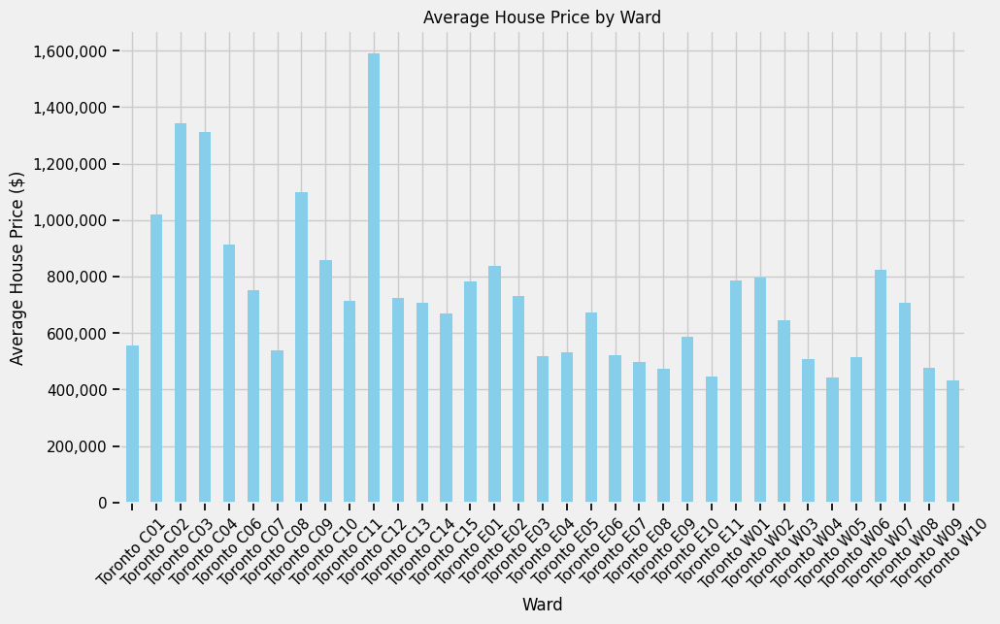

Ward
Toronto C01    5.557755e+05
Toronto C02    1.018489e+06
Toronto C03    1.343725e+06
Toronto C04    1.312001e+06
Toronto C06    9.126142e+05
Toronto C07    7.523595e+05
Toronto C08    5.383287e+05
Toronto C09    1.100279e+06
Toronto C10    8.567383e+05
Toronto C11    7.153457e+05
Toronto C12    1.589901e+06
Toronto C13    7.235383e+05
Toronto C14    7.082479e+05
Toronto C15    6.700245e+05
Toronto E01    7.831340e+05
Toronto E02    8.369234e+05
Toronto E03    7.300167e+05
Toronto E04    5.179585e+05
Toronto E05    5.316798e+05
Toronto E06    6.725433e+05
Toronto E07    5.214681e+05
Toronto E08    4.984787e+05
Toronto E09    4.729500e+05
Toronto E10    5.884266e+05
Toronto E11    4.447000e+05
Toronto W01    7.861734e+05
Toronto W02    7.977426e+05
Toronto W03    6.447350e+05
Toronto W04    5.088638e+05
Toronto W05    4.420862e+05
Toronto W06    5.142117e+05
Toronto W07    8.251021e+05
Toronto W08    7.070309e+05
Toronto W09    4.780245e+05
Toronto W10    4.336372e+05
Name: Composite

In [704]:
from matplotlib.ticker import FuncFormatter
# Plotting 'ward' vs 'composite benchmark' to see how it varies
plt.figure(figsize=(20, 10))  # Set the size of the plot
average_house_prices = house_prices_simplified.groupby('Ward')['Composite Benchmark'].mean()

plt.figure(figsize=(10, 6))
ax = average_house_prices.plot(kind='bar', color='skyblue')

# Step 3: Add labels and title
plt.xlabel('Ward')
plt.ylabel('Average House Price ($)')
plt.title('Average House Price by Ward')
plt.xticks(rotation=45)
formatter = FuncFormatter(lambda x, _: f'{x:,.0f}')  # Format with commas and no decimals
ax.yaxis.set_major_formatter(formatter)

# Show the plot
plt.show()

# Optionally, print the average prices
print(average_house_prices)

<Figure size 1200x600 with 0 Axes>

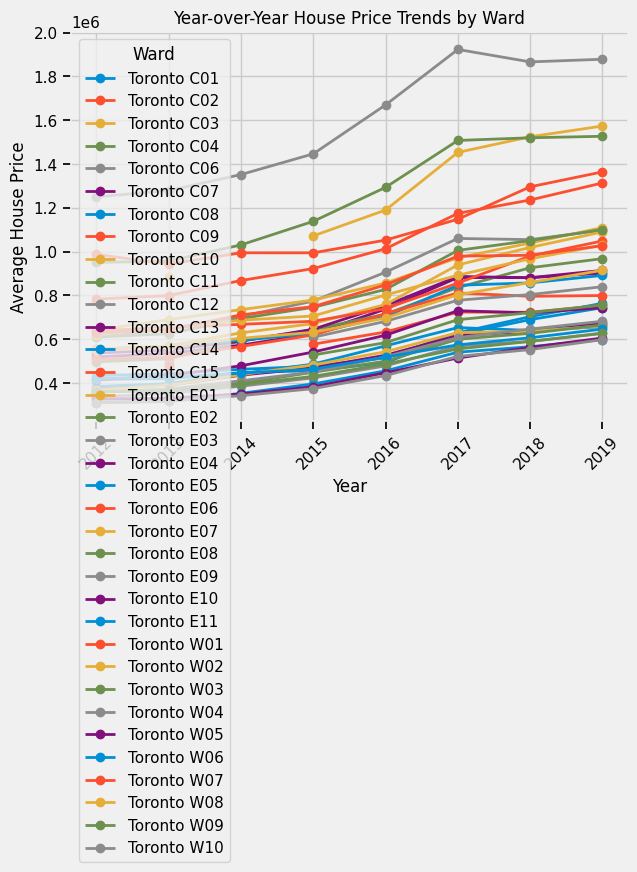

In [705]:
annual_prices = house_prices_simplified.groupby(['Ward', 'Year'])['Composite Benchmark'].mean().unstack(level=0)

# Step 2: Plot the line chart
plt.figure(figsize=(12, 6))

# Plot the data for each ward
annual_prices.plot(kind='line', marker='o', linestyle='-', linewidth=2, markersize=6)

# Step 3: Add labels and title
plt.xlabel('Year')
plt.ylabel('Average House Price')
plt.title('Year-over-Year House Price Trends by Ward')
plt.xticks(rotation=45)  # Rotate x-axis labels if necessary
plt.legend(title='Ward', loc='upper left')

# Show the plot
plt.tight_layout()
plt.show()